### animation of convolution of two functions

ref: 

https://dspillustrations.com/pages/posts/misc/convolution-examples-and-the-convolution-integral.html

https://stackoverflow.com/questions/56095788/convolution-integral-export-as-animation

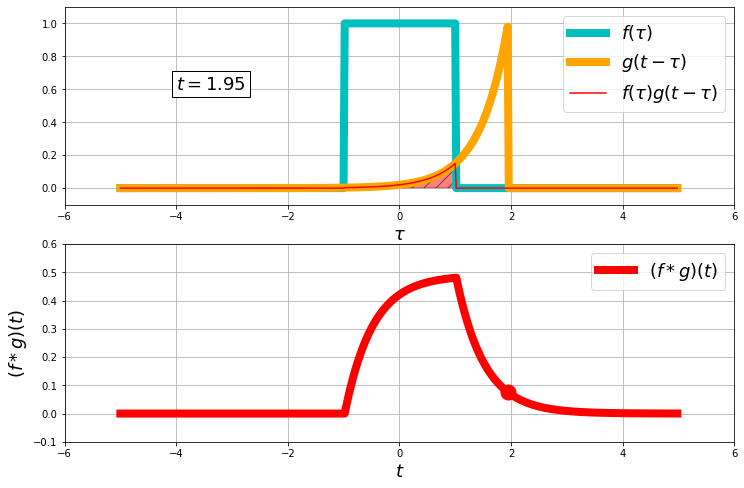

In [1]:
import scipy.integrate
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

def showConvolution(t0,f1,f2):
    # Calculate the overall convolution result using Simpson integration
    convolution = np.zeros(len(t))
    for n, t_ in enumerate(t):
        prod = lambda tau: f1(tau) * f2(t_-tau)
        convolution[n] = scipy.integrate.simps(prod(t), t)

    # Create the shifted and flipped function
    f_shift = lambda t: f2(t0-t)
    prod = lambda tau: f1(tau) * f2(t0-tau)

    # Plot the curves
    plt.gcf().clear() # il
    #plt.figure(figsize=(8,4))
    plt.subplot(211)
    plt.gca().set_ymargin(0.05) # il
    plt.plot(t, f1(t), 'c',label=r'$f(\tau)$',linewidth=8)
    plt.plot(t, f_shift(t), 'orange',label=r'$g(t-\tau)$',linewidth=8)
    plt.fill(t, prod(t), color='r', alpha=0.5, edgecolor='black', hatch='//') # il
    plt.plot(t, prod(t), 'r-', label=r'$f(\tau)g(t-\tau)$')
    plt.grid(True); plt.xlabel(r'$\tau$',fontsize=18) #plt.ylabel(r'$x(\tau)$') # il
    plt.legend(fontsize=18) # il
    plt.ylim([-0.1,1.1])
    plt.xlim([-6,6])
    plt.text(-4, 0.6, '$t=%.2f$' % t0, bbox=dict(fc='white'),fontsize=18) # il

    # plot the convolution curve
    plt.subplot(212)
    plt.gca().set_ymargin(0.05) # il
    plt.plot(t, convolution, 'r',label='$(f*g)(t)$',linewidth=8)

    # recalculate the value of the convolution integral at the current time-shift t0
    current_value = scipy.integrate.simps(prod(t), t)
    plt.plot(t0, current_value, 'ro',markersize=15)  # plot the point
    plt.grid(True); plt.xlabel('$t$',fontsize=18); plt.ylabel('$(f*g)(t)$',fontsize=18) # il
    plt.ylim([-0.1,0.6])
    plt.xlim([-6,6])
    plt.legend(fontsize=18) # il
    #plt.show() # il

Fs = 50  # our sampling frequency for the plotting
T = 5    # the time range we are interested in
t = np.arange(-T, T, 1/Fs)  # the time samples
#f1 = lambda t: np.maximum(0, 1-abs(t))
f1 = lambda t: (abs(t)<1)
#f1 = lambda t: np.sin(t)
f2 = lambda t: (t>0) * np.exp(-2*t)

#f1 = lambda t: np.sin(t)
#f2 = lambda t: (abs(t)<0.5)

t0 = np.arange(-2.0,2.0, 0.05)

fig = plt.figure(figsize=(12,8))
anim = animation.FuncAnimation(fig, showConvolution, frames=t0, fargs=(f1,f2),interval=80)

anim.save('animation2.gif', writer='imagemagick', fps=30,dpi=100)


In [3]:
from IPython.display import Image

Image(url='animation2.gif')

### image o and x

ref:

https://learnopencv.com/number-of-parameters-and-tensor-sizes-in-convolutional-neural-network/

https://www.youtube.com/watch?v=B-M5q51U8SM

https://gitlab.com/brohrer/convolution-2d-animation

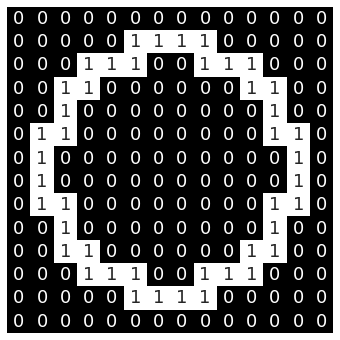

In [5]:
import seaborn as sns

image_o = np.array([
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0],
    [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
    [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
    [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
    [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0],
    [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
    [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
    [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0],
    [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
    [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
    [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
    [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
])

def plot_heatmap(img,name):
    plt.figure(figsize=(6,6))
    ax=sns.heatmap(img,annot=True,cmap='Greys_r',cbar=False,annot_kws={"size":18})
    plt.xticks([])
    plt.yticks([])
    ax.set_aspect('equal', 'box')
    plt.savefig(name+'.png',dpi=350)
    
plot_heatmap(image_o,'o')

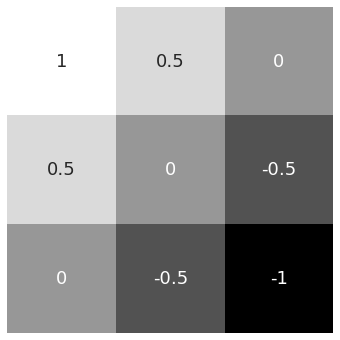

In [7]:
kernel_diag_fwd = np.array([
    [1, .5, 0],
    [.5, 0, -.5],
    [0, -.5, -1]
])

kernel_vert = np.array([
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1]
])
kernel_horz = np.array([
    [1, 1, 1],
    [0, 0, 0],
    [-1, -1, -1]
])

plot_heatmap(kernel_diag_fwd,'diag')

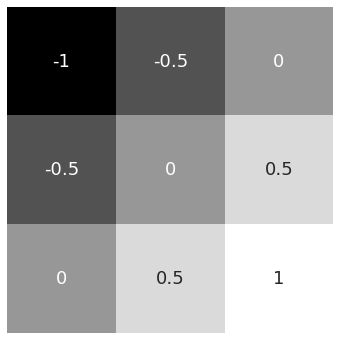

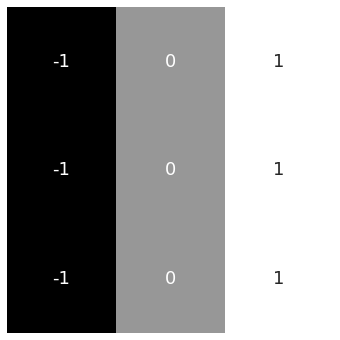

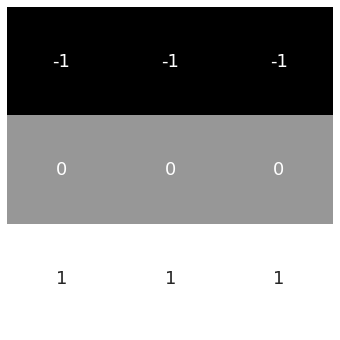

In [9]:
rev_diag = np.rot90(kernel_diag_fwd, k=2, axes=(0, 1))
rev_vert = np.rot90(kernel_vert, k=2, axes=(0, 1))
rev_horz = np.rot90(kernel_horz, k=2, axes=(0, 1))

plot_heatmap(rev_diag,'diag_r')
plot_heatmap(rev_vert,'vert_r')
plot_heatmap(rev_horz,'horz_r')

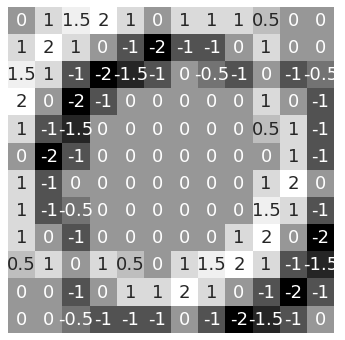

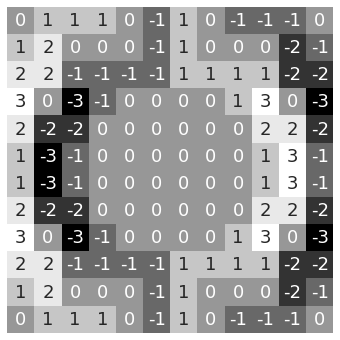

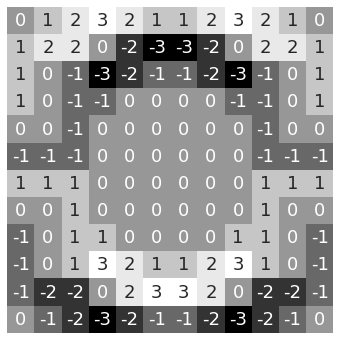

In [10]:
def get_conv(img,kernel):

    fm=np.zeros((12,12))

    for i in range(12):
        for j in range(12):
            fm[i,j]=np.sum(img[i:i+3,j:j+3]*kernel)
            
    return fm

fm=get_conv(image_o,rev_diag)
plot_heatmap(fm,'diag_conv')
fm_v=get_conv(image_o,rev_vert)
plot_heatmap(fm_v,'vert_conv')
fm_h=get_conv(image_o,rev_horz)
plot_heatmap(fm_h,'vert_horz')

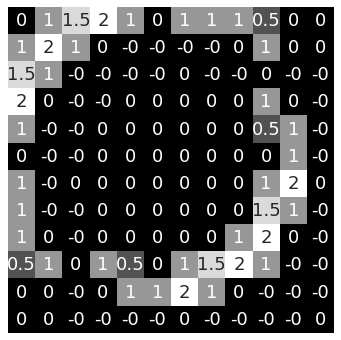

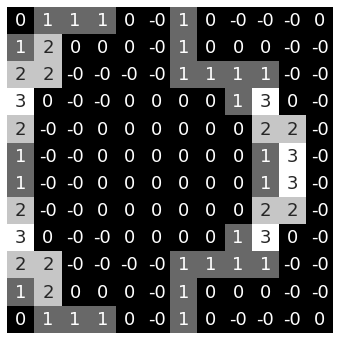

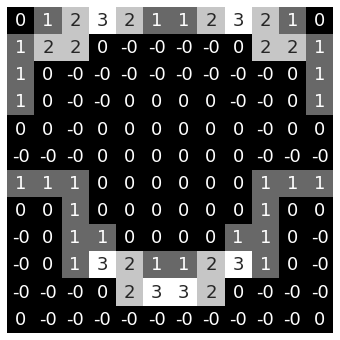

In [12]:
#relu

rlu=fm*(fm > 0)
rlu_v=fm_v*(fm_v>0)
rlu_h=fm_h*(fm_h>0)

plot_heatmap(rlu,'diag_relu')
plot_heatmap(rlu_v,'vert_relu')
plot_heatmap(rlu_h,'horz_relu')

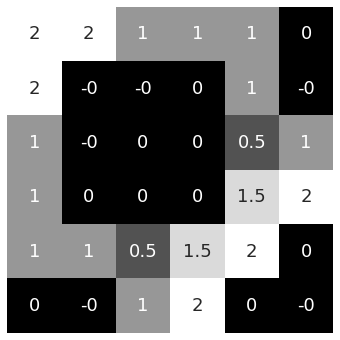

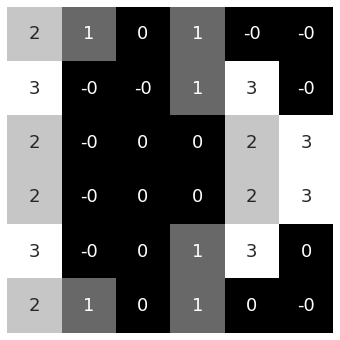

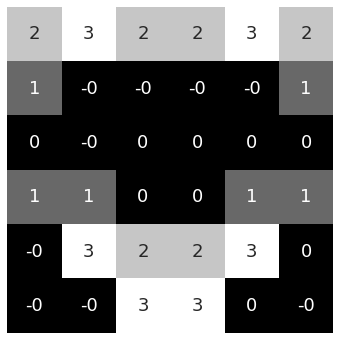

In [14]:
#maxpooling

def get_mp(relu):

    mp=np.zeros((6,6))
    for i in range(6):
        for j in range(6):
            mp[i,j]=np.max(relu[i*2:i*2+2,j*2:j*2+2])
            
    return mp

def get_mp_6(relu):

    mp=np.zeros((4,4))
    for i in range(4):
        for j in range(4):
            mp[i,j]=np.max(relu[i*2:i*2+4,j*2:j*2+4])
            
    return mp

plot_heatmap(get_mp(rlu),'diag_mp')
plot_heatmap(get_mp(rlu_v),'v_mp')
plot_heatmap(get_mp(rlu_h),'h_mp')

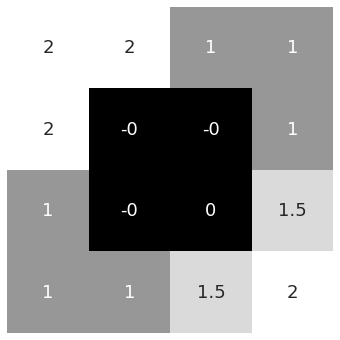

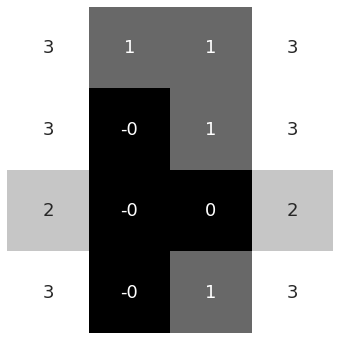

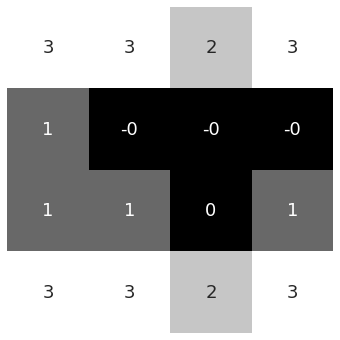

In [15]:
plot_heatmap(get_mp_6(rlu),'diag_mp_6')
plot_heatmap(get_mp_6(rlu_v),'v_mp_6')
plot_heatmap(get_mp_6(rlu_h),'h_mp_6')

### mnist cnn

In [16]:
import keras
from keras import Model
from keras.datasets import mnist
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten
from keras.models import Sequential
import numpy as np
import matplotlib.pyplot as plt

def preprocess_data():
    n_out=10

    (x_train,y_train),(x_test,y_test)=mnist.load_data()

    x_train=x_train/255.
    x_test=x_test/255.

    #one-hot encoding
    y_train = keras.utils.np_utils.to_categorical(y_train, n_out)
    y_test = keras.utils.np_utils.to_categorical(y_test, n_out)

    x_train = np.expand_dims(x_train, axis=3)
    x_test = np.expand_dims(x_test, axis=3)

    #print(x_train.shape, y_train.shape,x_test.shape,y_test.shape)
    
    return x_train,y_train,x_test,y_test

x_train,y_train,x_test,y_test=preprocess_data()

cnn=Sequential()
cnn.add(Conv2D(filters=16,kernel_size=(3,3),activation='relu',input_shape=(28,28,1)))
#cnn.add(Conv2D(filters=n_f,kernel_size=(3,3),activation='relu'))
cnn.add(MaxPooling2D((2,2)))
cnn.add(Conv2D(filters=16,kernel_size=(3,3),activation='relu'))
#cnn.add(Conv2D(filters=n_f,kernel_size=(3,3),activation='relu'))
cnn.add(MaxPooling2D((2,2)))
#cnn.add(Conv2D(filters=64,kernel_size=(3,3),activation='relu'))
#cnn.add(Conv2D(filters=16,kernel_size=(3,3),activation='relu'))
#cnn.add(MaxPooling2D((2,2)))

cnn.add(Flatten())
cnn.add(Dense(32,activation='relu'))
cnn.add(Dense(10,activation='softmax'))                   
cnn.summary()

cnn.compile(loss='categorical_crossentropy',
            optimizer='adam',
            metrics=['categorical_accuracy'])

traj=cnn.fit(x_train,y_train,epochs=10,batch_size=32,verbose=1,shuffle=True,validation_data=(x_test, y_test))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 16)        2320      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 400)               0         
                                                                 
 dense (Dense)               (None, 32)                1

2022-06-30 12:49:57.942952: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


1875/1875 [==============================] - 8s 4ms/step - loss: 0.2263 - categorical_accuracy: 0.9295 - val_loss: 0.0753 - val_categorical_accuracy: 0.9774
Epoch 2/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0737 - categorical_accuracy: 0.9771 - val_loss: 0.0623 - val_categorical_accuracy: 0.9801
Epoch 3/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0539 - categorical_accuracy: 0.9833 - val_loss: 0.0415 - val_categorical_accuracy: 0.9862
Epoch 4/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0433 - categorical_accuracy: 0.9867 - val_loss: 0.0421 - val_categorical_accuracy: 0.9859
Epoch 5/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0366 - categorical_accuracy: 0.9884 - val_loss: 0.0436 - val_categorical_accuracy: 0.9858
Epoch 6/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0310 - categorical_accuracy: 0.9895 - val_loss: 0.0364 - val_categorical_accuracy: 0.9867
Epo

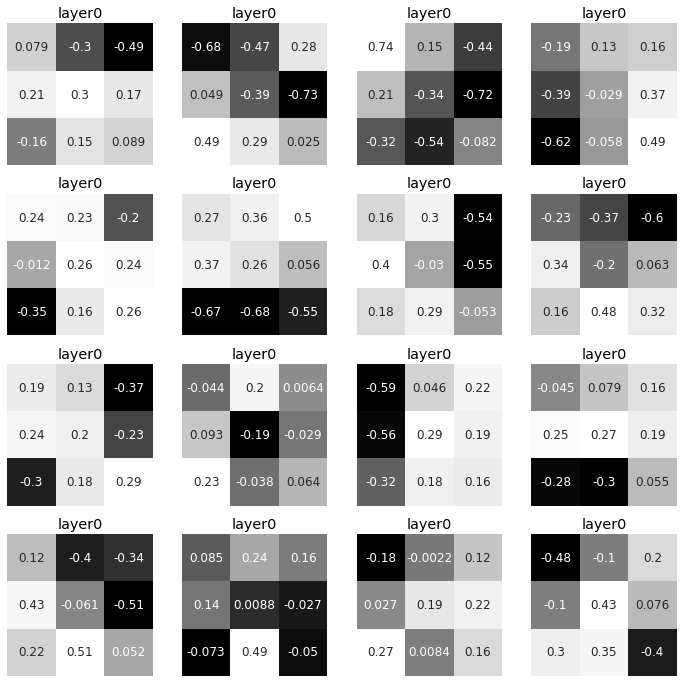

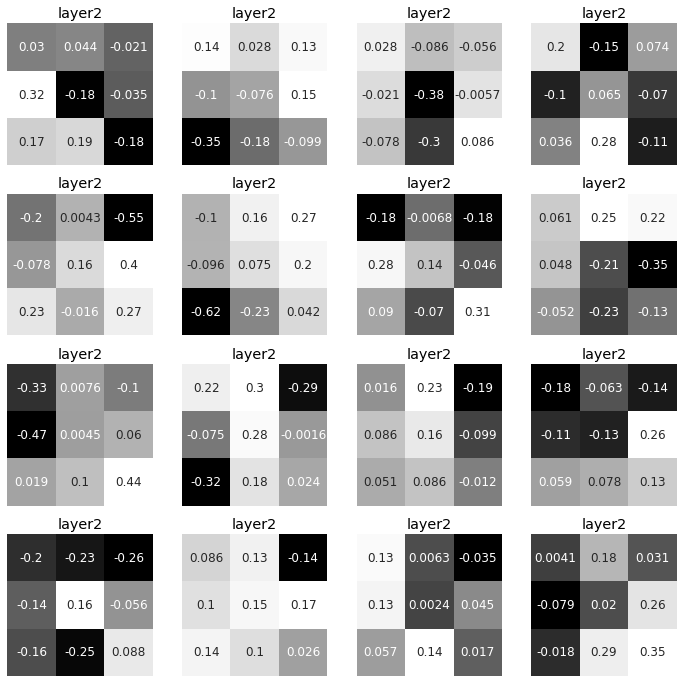

In [20]:
def show_weights_16_layer1(model,layer=0):

    plt.rcParams['font.size']='12'

    plt.figure(figsize=(12,12))
    w,b=model.layers[layer].get_weights()
    for i in range(16):
        plt.subplot(4,4,i+1)
        sns.heatmap(w[:,:,0,i],cmap='Greys_r',annot=True,cbar=False)
        plt.xticks([])
        plt.yticks([])
        plt.title('layer'+str(layer))
        
    plt.savefig('cnn_mnist_layer'+str(layer)+'.png',dpi=350)
    
show_weights_16_layer1(cnn,layer=0)
show_weights_16_layer1(cnn,layer=2)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 26, 26, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 16)        2320      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 400)               0   

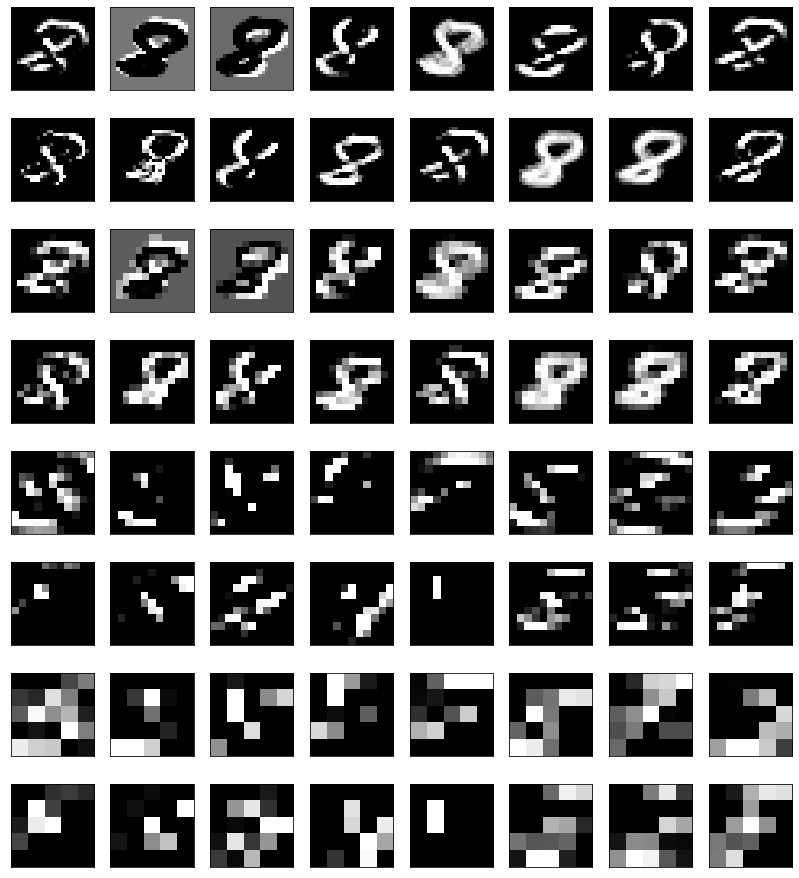

In [22]:
def deimg(channel_image):
    channel_image -= channel_image.mean()
    channel_image /= channel_image.std()
    channel_image *= 64
    channel_image += 128
    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
    
    return channel_image

layer_outputs = [layer.output for layer in cnn.layers[0:5]]
activation_model = Model(inputs=cnn.input,outputs=layer_outputs)
activations = activation_model.predict(np.expand_dims(x_test[61,:,:,:], axis=0))
activation_model.summary()

plt.figure(figsize=(14,16))

cnt=1
for j in range(4):
    for i in range(16):
        plt.subplot(8,8,cnt)
        plt.imshow(deimg(activations[j][0,:, :,i]),cmap='Greys_r')
        plt.xticks([])
        plt.yticks([])
        cnt+=1
        
plt.savefig('test_8_activation_each_layer_cnn_mnist.png',dpi=350)

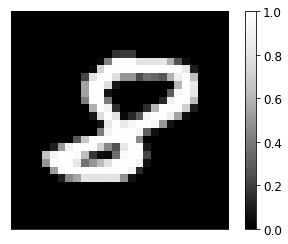

In [23]:
img=x_test[61,:,:,0]
plt.imshow(img,cmap='Greys_r')
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.savefig('test_8_cnn_mnist.png',dpi=350)

### visualize VGG filters

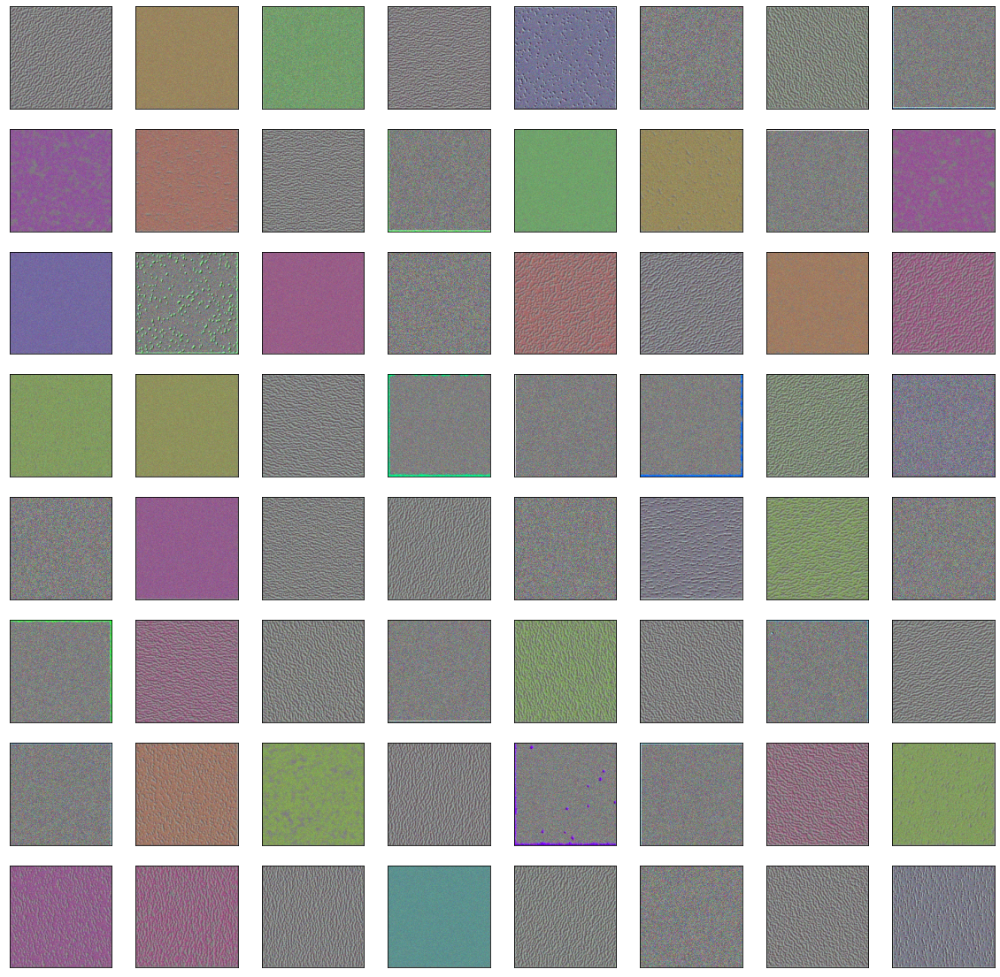

In [26]:
from tensorflow.keras.applications.vgg16 import VGG16
from keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def show_filter(layer_name='block1_conv1', filter_idx=0):

    model = VGG16(weights='imagenet',include_top=False)
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_idx])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])

    #loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])
    input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.
    step=1.
    # run gradient ascent for 20 steps
    for i in range(20):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    
    img=input_img_data[0]
    
    return deprocess_image(img)

def plot_filter(layer_name='block1_conv1'):
    plt.figure(figsize=(20,20))
    for i in range(64):
        plt.subplot(8,8,i+1)
        plt.imshow(show_filter(layer_name=layer_name, filter_idx=i))
        plt.xticks([])
        plt.yticks([])

    plt.savefig(layer_name+'_vgg.png',dpi=350)
    
plot_filter(layer_name='block1_conv1')

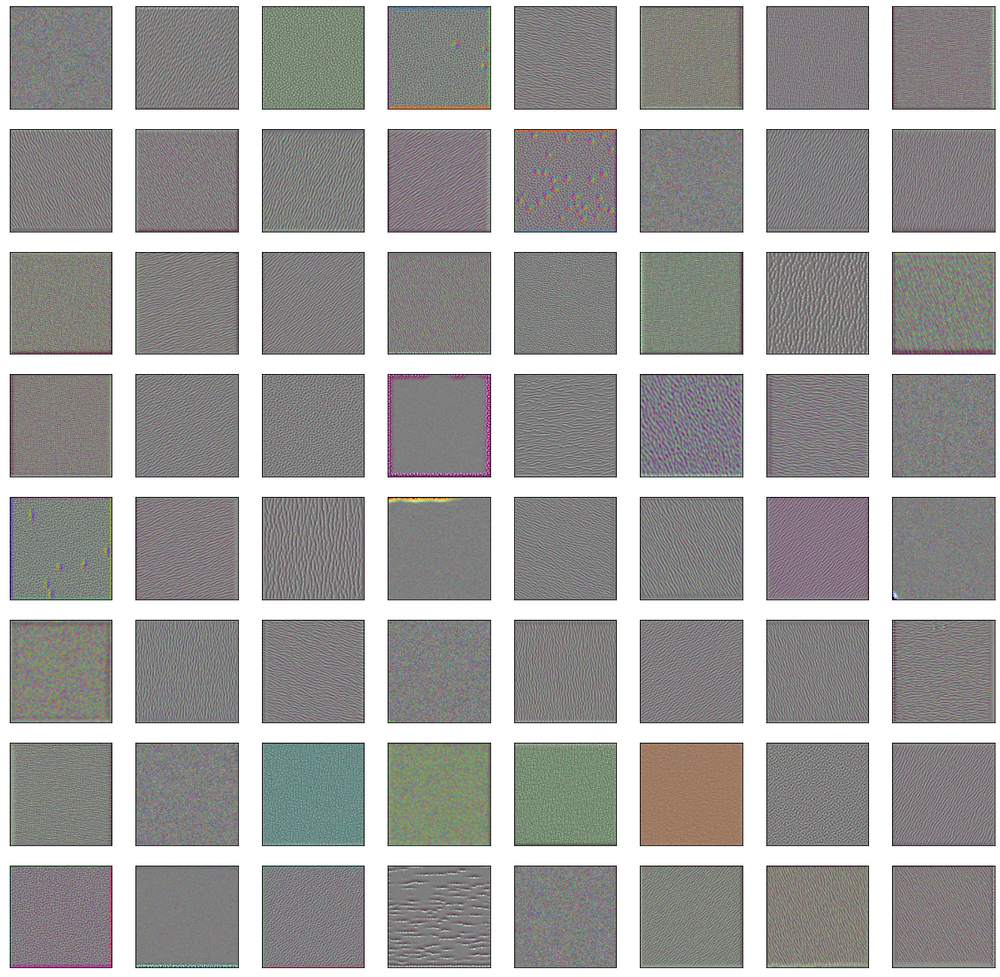

In [27]:
plot_filter(layer_name='block2_conv1')

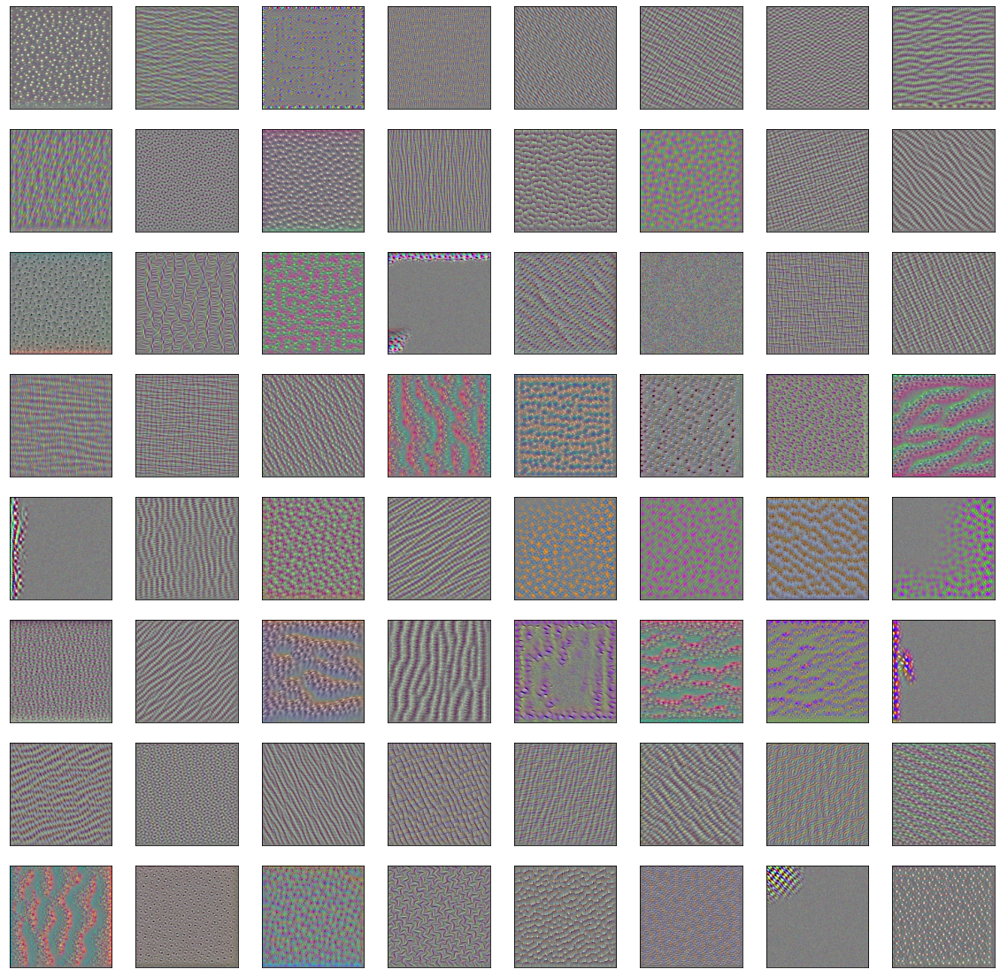

In [28]:
plot_filter(layer_name='block3_conv1')

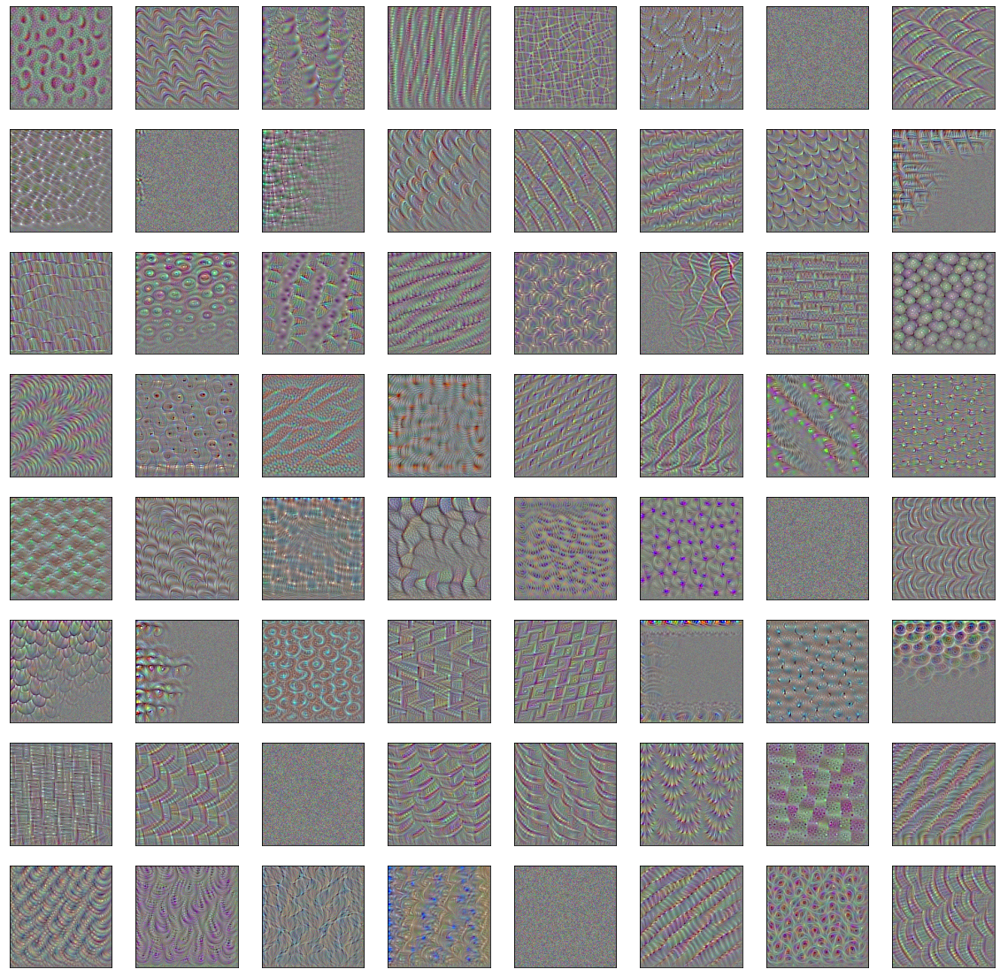

In [29]:
plot_filter(layer_name='block4_conv1')

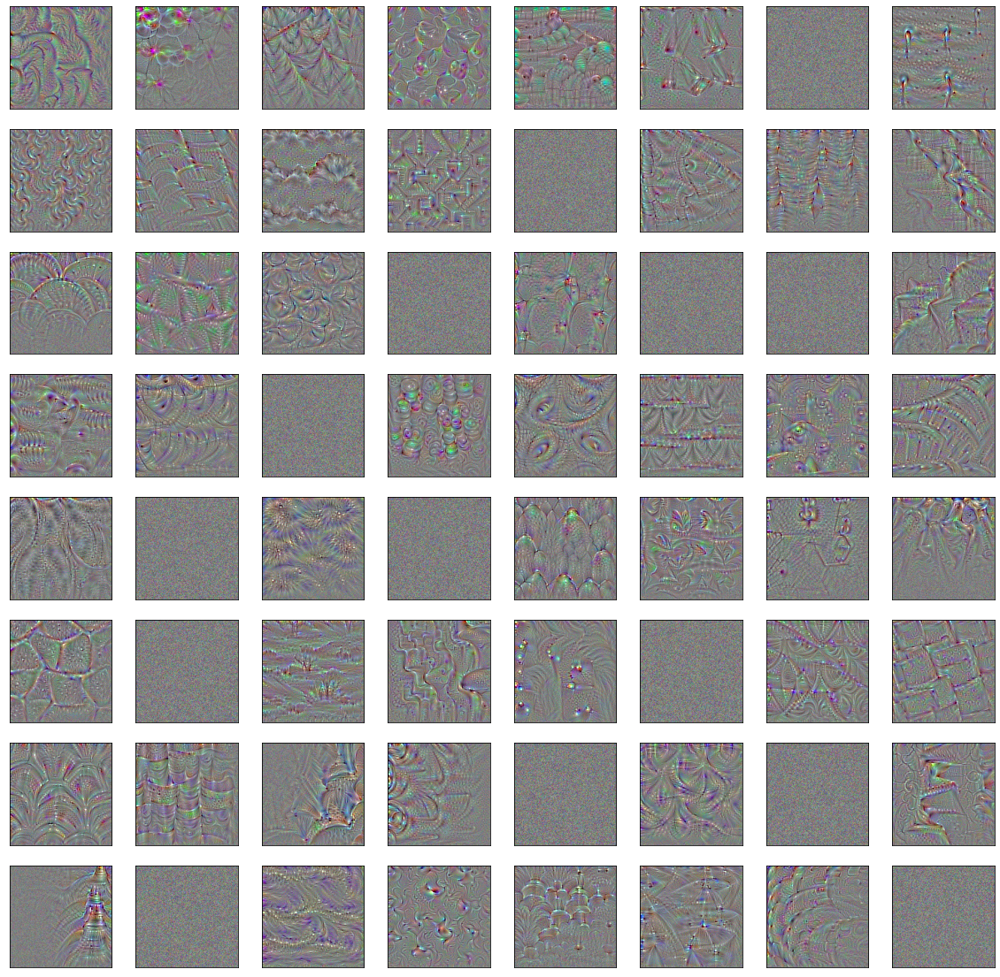

In [30]:
plot_filter(layer_name='block5_conv1')

In [31]:
model = VGG16(weights='imagenet',include_top=False)
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_385 (InputLayer)      [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     